In [1]:
import sys
# add ../ to the path
sys.path.append('../')

In [12]:
# generic & ml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import tensor as tt

import scanpy as sc
import anndata
import collections

from time import sleep
import config as cfg

from sklearn.decomposition import PCA
import umap


In [5]:
import module as md

torch_models successfully imported.


remember you can close sections and subsections that you are not interested in

# Loading data

In [14]:
path = "../" + cfg.path
path

'../data/130723_data_hepatocytes.h5ad'

In [15]:
adatas = {
    "Tomaz": sc.read_h5ad(path),
}
data = anndata.concat(adatas, label="dataset", join="inner")
sample_names = data.obs["orig.ident"]
sample_list = np.unique(sample_names)

In [16]:
# removing the bad replicate
remove = "scRNA_Seq_Tomaz_220531-01-M-ZT22-H-lib_1-129S"
remove_mask = np.invert(sample_names == remove)

# update data and sample list after the removal of the sample
data = data[remove_mask, :]
print(data.shape)

# filter mitochoncdrial genes
genes_mito = [s.startswith("mt-") for s in data.var.index]
genes_Mup = [s.startswith("Mup") for s in data.var.index]
genes_keep = np.logical_not(np.logical_or(genes_mito, genes_Mup))
# cut out cells with an unusual number of reads + too low mito content
cells_keep = np.logical_and(data.obs["nCount_RNA"] < 15000, data.obs["percent.mt"] > 3)


data = data[cells_keep, genes_keep]
data

(24039, 18777)


View of AnnData object with n_obs × n_vars = 20080 × 18742
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.intron', 'Sex', 'ZT', 'Variables', 'percent.mt', 'percent.caspase', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.3', 'seurat_clusters', 'integrated_snn_res.0.5', 'dataset'
    obsm: 'X_pca', 'X_tsne'

In [17]:
# #make design matrix: number of cells x number of samples
sample_names = data.obs["orig.ident"]
sample_names_uniq = np.unique(data.obs["orig.ident"])
sample_annot = [
    [i] + s.split("_")[3].split("-")[0:4] for i, s in enumerate(sample_names_uniq)
]
sample_annot = np.array(sample_annot)
sample_annot

array([['0', '211129', '01', 'F', 'ZT10'],
       ['1', '211129', '02', 'M', 'ZT10'],
       ['2', '211129', '03', 'F', 'ZT10'],
       ['3', '211215', '05', 'M', 'ZT10'],
       ['4', '220530', '01', 'M', 'ZT22'],
       ['5', '220530', '02', 'F', 'ZT22'],
       ['6', '220531', '02', 'F', 'ZT22'],
       ['7', '220531', '03', 'M', 'ZT22'],
       ['8', '220601', '02', 'F', 'ZT22'],
       ['9', '220614', '01', 'M', 'ZT10'],
       ['10', '220614', '02', 'F', 'ZT10']], dtype='<U21')

In [18]:
# design matrix is torch.tensor as it is used in pyro
sample_id = np.zeros(data.n_obs, dtype=np.int64)
for i, s in enumerate(sample_names_uniq):
    sample_id[sample_names == s] = i
design_matrix = make_design_matrix(torch.tensor(sample_id, dtype=torch.int64))
data.obs["sample_id"] = sample_id

NameError: name 'make_design_matrix' is not defined

In [19]:
# normalize each sample
data.layers["n_cg"] = data.X.toarray()
data.layers["f_cg"] = data.layers["n_cg"].copy()
nc = np.zeros(data.n_obs)
for s in np.unique(sample_id):
    idx = sample_id == s
    tmp = data.layers["n_cg"][idx, :].sum(axis=1)
    nc[idx] = tmp
    data.layers["f_cg"][idx, :] = (
        data.layers["f_cg"][idx, :] / tmp[:, None]
    )  # normalization!
data.obs["n_c"] = nc

In [20]:
def gene_index(data, gene):
    return np.where(gene == data.var.index)[0][0]

Initalizing the zero-order Legendre coefficient to the mean

In [21]:
# from Hildebrandt 2021
central = [
    "Oat",
    "Cyp2e1",
    "Lect2",
    "Cyp2c37",
    "Gulo",
    "Cyp2a5",
    "Glul",
    "Aldh1a1",
    "Cyp1a2",
    "Slc22a1",
    "Slc1a2",
]
portal = ["Pck1", "Aldh1b1", "Ctsc", "Sds", "Hal", "Hsd17b13", "Cyp2f2"]


# new list based on our method
# portal=['Pigr', 'Plxna2', 'B4galt5', 'Pck1', 'Etnppl', 'Slc25a51', 'Arhgap24',
#        'Hsd17b13', 'Sds', 'Retsat', 'Uroc1', 'Apoc2', 'Cyp2a4', 'Cyp2f2',
#        'Hpx', 'Fgfr2', 'Slc7a2', 'Apoa4', 'Ftcd', 'Hal', 'Gls2', 'Serpina1d',
#        'Aspg', 'Gcnt2', 'Sfxn1', 'C9', 'Gldc']
# central=['Aox1', 'Cyp27a1', 'Glul', 'Esrrg', 'Fam107b', 'Cyp7b1', 'Cyp7a1',
#        'Pon1', 'Slco1b2', 'Cyp2a5', 'Oat', 'Cyp2e1', 'Tenm3', 'Msmo1',
#        'Cyp1a2', 'Aqp9', 'Sult3a1', 'Slc16a10', 'Tafa2', 'Igfbp1', 'Aldh3a2',
#        'Rnf43', 'Ahr', 'Slc25a21', 'Rdh11', 'Acot3', 'Lect2', 'Ube2e2', 'Erc2',
#        'Rnase4', 'Ang', 'Ang4', 'Gulo', 'Cyp2d9', 'Csad', 'Slc22a1', 'Rmdn2',
#        'Ablim3', 'Aldh1a1', 'Cyp2c38', 'Cyp2c69', 'Cyp2c37', 'Cyp2c54',
#        'Cyp2c50', 'Slk', 'Cyp3a41b', 'Cyp3a41a', 'Cyp3a44', 'Sult3a2']


genes = central + portal
# genes=other_gene_list

# check that they are all there (use set intersections)
assert len(central) == len(set(central) & set(data.var.index))
assert len(portal) == len(set(portal) & set(data.var.index))

data_pyro = data[:, genes]
NC, NG = data_pyro.shape

In [22]:
mask_f = data.obs["Sex"].values == "female"

sample_names_uniq

array(['scRNA_Seq_Tomaz_211129-01-F-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_211129-02-M-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_211129-03-F-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_211215-05-M-ZT10-H-lib_M-129S',
       'scRNA_Seq_Tomaz_220530-01-M-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220530-02-F-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220531-02-F-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220531-03-M-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220601-02-F-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220614-01-M-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220614-02-F-ZT10-H-lib_1-129S'], dtype=object)

In [23]:
# now from the vector , I want to extract the sec of the sample
# this is contained i the sring , -F- or -M- are the two options
# loop over the entry of the vector and check if _F_ is cntained in the string

sample_sex = np.zeros(11, dtype=np.int64)

for i, s in enumerate(sample_names_uniq):
    sample_sex[i] = 0 if "-F-" in s else 1

# trying to remove confounding effects

[0.1976252  0.09392256 0.08223242 0.05998219 0.05461348 0.05084804
 0.05015424 0.04859089 0.04715458 0.04446445 0.04285703 0.04039256
 0.03997089 0.03660583 0.03231737 0.03102241 0.02743589 0.01981001]


Text(0.5, 1.0, 'Explained variance of noise')

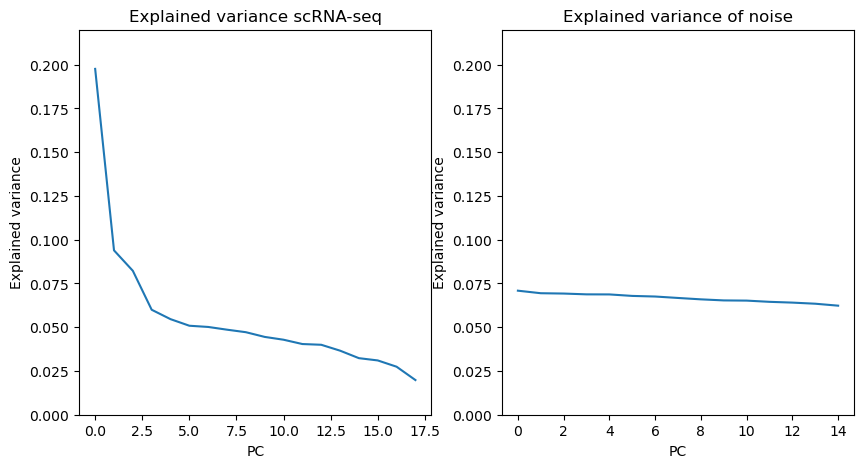

In [24]:
pca = PCA(n_components=NG, whiten=False)
X_pca = data_pyro.layers["f_cg"]

# normalize yourself
X_pca = X_pca - X_pca.mean(axis=0)[None, :]
X_pca = X_pca / np.sqrt(X_pca.var(axis=0))[None, :]
PC = pca.fit_transform(X_pca)

# create dataaset of compplete noise
data2 = np.random.normal(0.0, 1.0, (10000, 15))
pca2 = PCA(n_components=15)
pca2.fit(data2)


# Print the explained variance ratio of the first two principal components
print(pca.explained_variance_ratio_)
evr = pca.explained_variance_ratio_
# double plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(evr)
plt.xlabel("PC")
plt.ylabel("Explained variance")
plt.ylim(0, 0.22)
plt.title("Explained variance scRNA-seq")


plt.subplot(1, 2, 2)
plt.plot(pca2.explained_variance_ratio_)
plt.ylim(0, 0.22)
plt.xlabel("PC")
plt.ylabel("Explained variance")
plt.title("Explained variance of noise")

In [25]:
# noramlized (with counts) and than meand centered and than normalized
corr_cell = np.corrcoef(X_pca)
corr_cell.shape

(20080, 20080)

In [26]:
reference_cell = data[:, "Glul"].X.argmax()

In [27]:
data[:, "Glul"].layers["f_cg"].shape

(20080, 1)

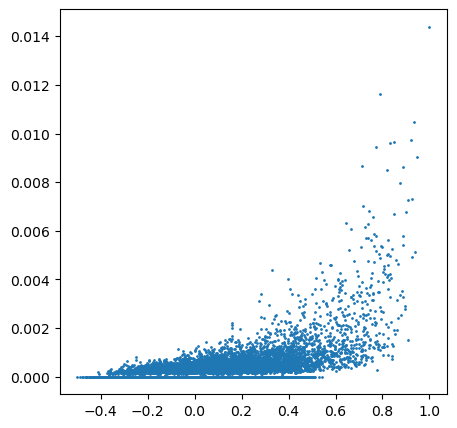

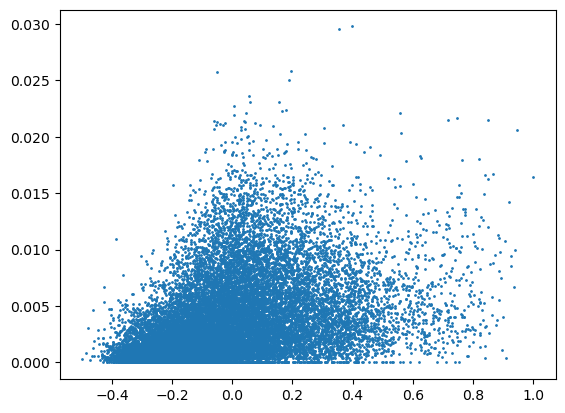

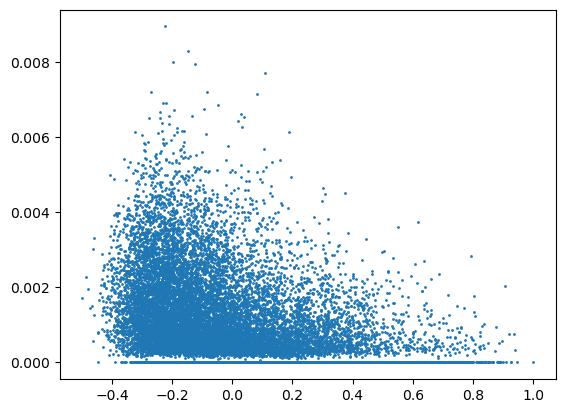

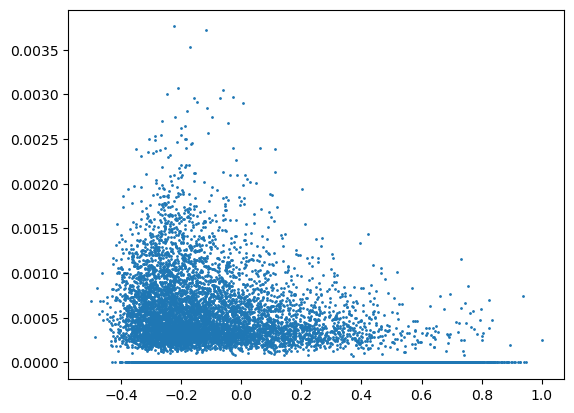

In [28]:
cor_vec = corr_cell[reference_cell, :]
cor_vec[:]

# plot expression of Glul vs cor_vec
plt.figure(figsize=(5, 5))
plt.scatter(cor_vec, data[:, "Glul"].layers["f_cg"], s=1)
plt.show()

# plot expression of Cyp2e1 vs cor_vec
plt.scatter(cor_vec, data[:, "Cyp2e1"].layers["f_cg"], s=1)
plt.show()

# plot expression of Cypf2
plt.scatter(cor_vec, data[:, "Cyp2f2"].layers["f_cg"], s=1)
plt.show()

plt.scatter(cor_vec, data[:, "Sds"].layers["f_cg"], s=1)
plt.show()

In [19]:
def secondary_components(proj, vec, component_vector=np.array([1, 2])):
    """
    function that reconstruct the data with the outer product of the components


    proj: projection of the data on the principal components
    vec: principal components
    component_vector: vector of the components to be used for the reconstruction
    """
    X_recon = np.zeros((NC, NG))
    for m in component_vector:
        X_recon += np.outer(proj[:, m], vec[m, :])

    return X_recon


X_conf = secondary_components(
    PC,
    pca.components_,
    np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]),
)
# X_conf=secondary_components(PC, pca.components_, np.array([1,2,3]))

In [20]:
X_zonation = X_pca - X_conf
# pca = PCA(n_components=NG, whiten=False)
# PC = pca.fit_transform(X_zonation)

Text(0, 0.5, 'PC2 entries values')

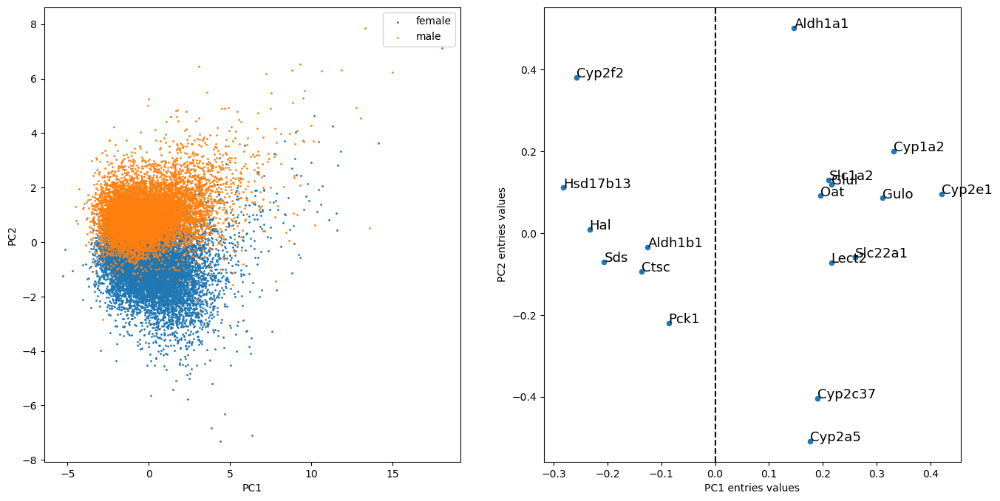

In [22]:
# print(X_pca.data_pca)
plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.scatter(PC[mask_f, 0], PC[mask_f, 1], label="female", s=1)
plt.scatter(
    PC[np.logical_not(mask_f), 0], PC[np.logical_not(mask_f), 1], label="male", s=1
)
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")
# plt.scatter(PC[:,0], PC[:,1], s=1,  c=mask_f, cmap='plasma')
# first two eigenvectors
x = pca.components_[0, :]
y = pca.components_[1, :]


plt.subplot(122)
plt.scatter(x, y, 20)
ix = np.abs(x) > np.percentile(np.abs(x), 0)
iy = np.abs(y) > np.percentile(np.abs(y), 0)
ii = np.logical_or(ix, iy)
# print(np.sum(ii))
for i, txt in enumerate(data_pyro.var.index[ii]):
    plt.annotate(txt, (x[ii][i], y[ii][i]), fontsize=13)

# plot a vertical line for x = 0
plt.axvline(x=0, color="k", linestyle="--")

plt.xlabel("PC1 entries values")
plt.ylabel("PC2 entries values")

# save figure as pdf
# plt.savefig('figures/PC1_PC2.pdf', bbox_inches='tight')

In [23]:
# define initial x's
x_unif = PC[:, 0]
x_unif = x_unif - x_unif.mean()
x_unif = x_unif / np.sqrt(x_unif.var())
x_unif.shape

(20080,)

In [24]:
# optimize a model that reconstructs the X_zonation that
# X_zonation[c,g] = np.exp( x[c]*a[g] + b[g] ), a ,b and x are parameters to be optimized
# use pytorch

# leaf vecrtors

# log PCA

In [25]:
nc_mean = data.obs["n_c"].mean()
nc_median = data.obs["n_c"].median()
print(nc_mean, nc_median)

eps = 1 / nc_mean

2953.4530876494023 2713.5


In [26]:
pca_log = PCA(n_components=NG, whiten=False)

log_data = np.log(data_pyro.layers["f_cg"] + eps)
log_means = log_data.mean(axis=0)
log_std = log_data.std(axis=0)

log_data = (log_data - log_means[None, :]) / log_std[None, :]

[0.20362921 0.0980458  0.07804266 0.05920656 0.05408533 0.05003513
 0.04942635 0.04784915 0.0456804  0.04402696 0.0420862  0.03972418
 0.03950135 0.03633709 0.03415326 0.03090605 0.02665371 0.02061054]


Text(0, 0.5, 'PC2 entries values')

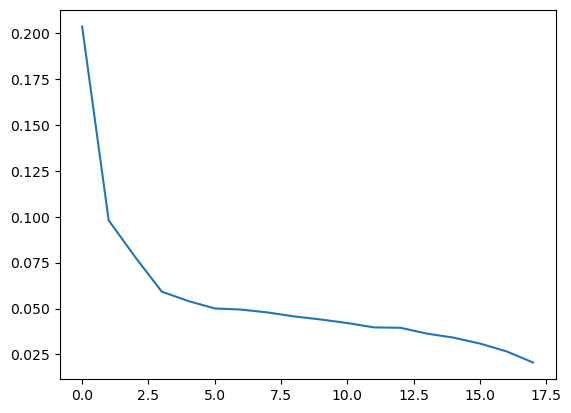

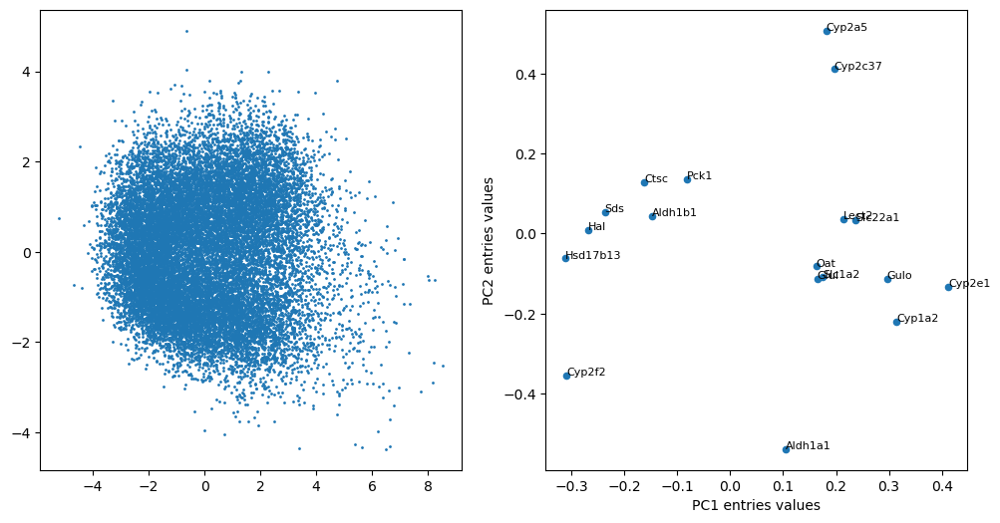

In [27]:
PC_log = pca_log.fit_transform(log_data)
vec_log = pca_log.components_

# Print the explained variance ratio of the first two principal components
print(pca_log.explained_variance_ratio_)
plt.plot(pca_log.explained_variance_ratio_)

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.scatter(PC_log[:, 0], PC_log[:, 1], s=1)
# first two eigenvectors
x = pca_log.components_[0, :]
y = pca_log.components_[1, :]

plt.subplot(122)
plt.scatter(x, y, s=20)
# print(np.sum(ii))
for i, txt in enumerate(data_pyro.var.index):
    plt.annotate(txt, (x[i], y[i]), fontsize=8)

plt.xlabel("PC1 entries values")
plt.ylabel("PC2 entries values")

Text(0, 0.5, 'Sds')

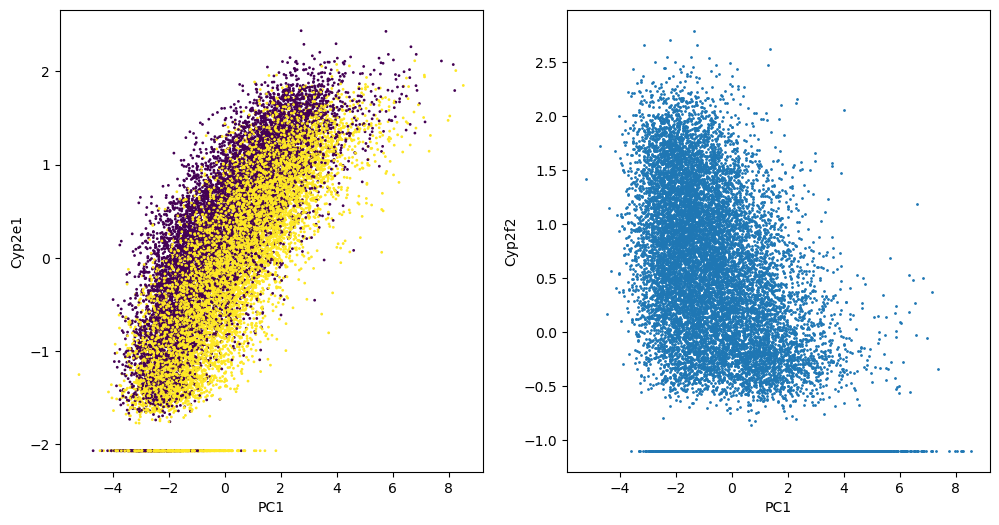

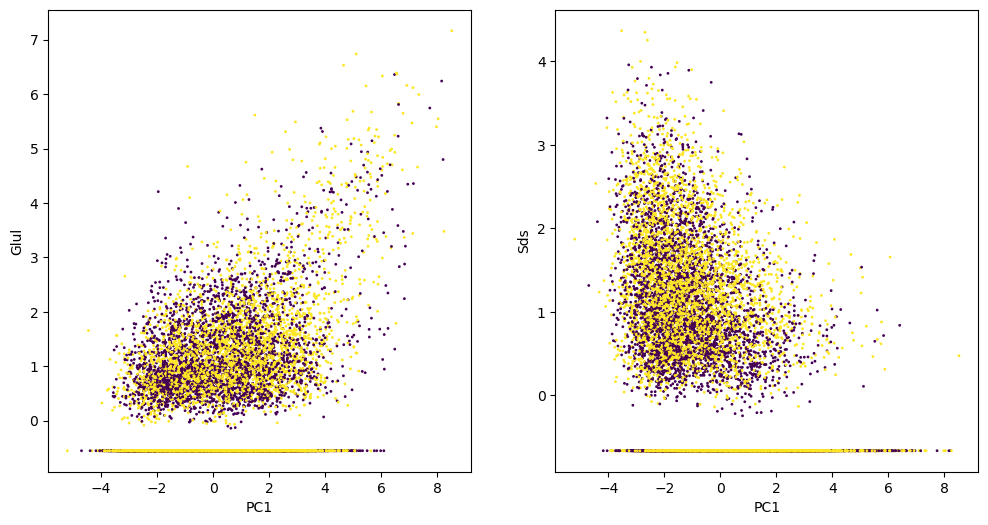

In [28]:
# now let's use secondary components on the log data
X_log_2 = secondary_components(PC_log, pca_log.components_, np.array([]))
X_zonation_log = log_data - X_log_2

# plot X_zonation_log expression of CYp2e1 against PC_LOG ONE
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.scatter(
    PC_log[:, 0], X_zonation_log[:, gene_index(data_pyro, "Cyp2e1")], s=1, c=mask_f
)
plt.xlabel("PC1")
plt.ylabel("Cyp2e1")

plt.subplot(122)
plt.scatter(PC_log[:, 0], X_zonation_log[:, gene_index(data_pyro, "Cyp2f2")], s=1)
plt.xlabel("PC1")
plt.ylabel("Cyp2f2")

plt.figure(figsize=(12, 6))
gene = "Glul"
plt.subplot(121)
plt.scatter(PC_log[:, 0], X_zonation_log[:, gene_index(data_pyro, gene)], s=1, c=mask_f)
plt.xlabel("PC1")
plt.ylabel(gene)

plt.subplot(122)
gene = "Sds"
plt.scatter(PC_log[:, 0], X_zonation_log[:, gene_index(data_pyro, gene)], s=1, c=mask_f)
plt.xlabel("PC1")
plt.ylabel(gene)

[[1.         0.96799274]
 [0.96799274 1.        ]]


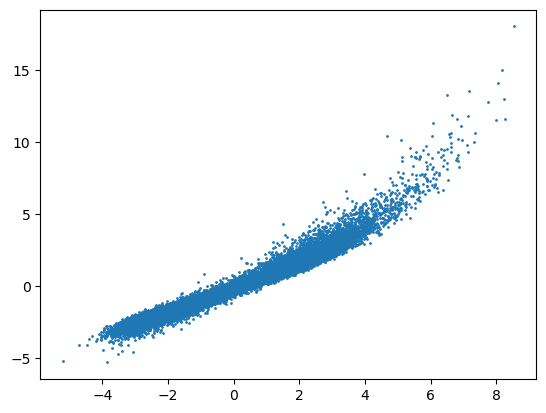

In [29]:
# perform PCA on X_zonation_log and than plot PC! against PC1 of log_data
pca_log_zonation = PCA(n_components=NG, whiten=False)
PC_log_zonation = pca_log_zonation.fit_transform(X_zonation_log)

# plt.scatter(PC_log[:, 0], PC_log_zonation[:, 0], s=1)
plt.scatter(PC_log[:, 0], PC[:, 0], s=1)
print(np.corrcoef(PC_log[:, 0], PC[:, 0]))

# Likelihood

In [30]:
# a0_pyro=import_data_txt('coeff_values/a0_pyro.txt')
# a1_pyro=import_data_txt('coeff_values/a1_pyro.txt').squeeze()
# x_pyro= import_data_txt('coeff_values/x_pyro.txt').squeeze()

a0_pyro = import_data_txt("coeff_values/small_set_a0.txt").squeeze()
a1_pyro = import_data_txt("coeff_values/small_set_a1.txt").squeeze()
x_pyro = import_data_txt("coeff_values/small_set_x.txt").squeeze()
# x_pyro = x_pyro - x_pyro.mean()

disp = 0.1414

In [31]:
def split_string(x):
    xxx = np.array([s.split(",") for s in x])
    xxy = xxx[:, 1:].astype(np.float64)
    return xxy.squeeze()


a1_pyro = split_string(a1_pyro)
x_pyro = split_string(x_pyro)
a0_pyro = split_string(a0_pyro)

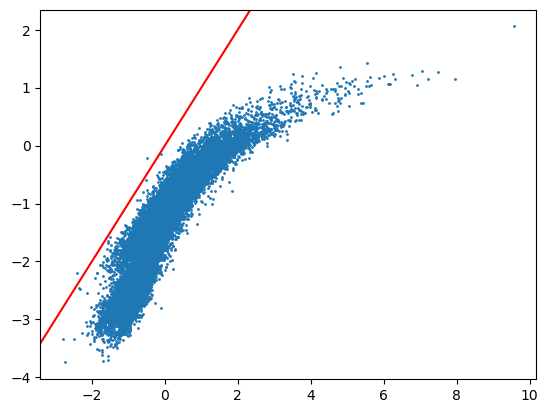

In [32]:
plt.scatter(x_unif, x_pyro, s=1)
plt.axline((0, 0), slope=1, c="red")

In [33]:
DM = design_matrix.type(torch.float)
log_UMI = torch.log(torch.tensor(data.obs["n_c"]))
DATA = tt(data_pyro[:, :].layers["n_cg"])

# plot of likelihood per cell

In [44]:
def like_values(x, a0, a1, disp, log_UMI, DM, DATA):
    """
    just a function to compute the likelihood of either the real data
    or the simulated data created chosing particular latent parameters
    """
    y = x[:, None] * a1[None, :] + log_UMI[:, None]
    y += np.matmul(DM, a0)
    lmbda = torch.exp(y)
    r = 1 / disp
    p = disp * lmbda / (disp * lmbda + 1)
    like_pyro = torch.distributions.NegativeBinomial(
        total_count=r, probs=p, validate_args=None
    )
    ll_cg = like_pyro.log_prob(DATA).detach()

    return ll_cg


like = like_values(tt(x_pyro), tt(a0_pyro), tt(a1_pyro), 0.1414, log_UMI, DM, DATA)
like.shape

torch.Size([20080, 18])

In [46]:
def likelihood_x(mu_cgx, disp, DATA):
    r = 1 / disp
    p = disp * mu_cgx / (disp * mu_cgx + 1)
    like_pyro = torch.distributions.NegativeBinomial(
        total_count=r, probs=p, validate_args=None
    )
    return like_pyro.log_prob(DATA).detach()

In [35]:
# many values of c for the plots
NX = 200
x_r = torch.linspace(-5, 5, NX)
x_range = x_r.repeat(NC, 1)
x_range = x_range[:, None, :]
x_range.shape

# keeping the three indexes since the begninning, and trusting the broadcasting insanely
y = x_range[:, :, :] * a1_pyro[None, :, None] + log_UMI[:, None, None]
y += np.matmul(DM, a0_pyro)[:, :, None]
mu_cgx = torch.exp(y)

In [36]:
# insert a flat dimension first

DATA_stack = DATA[:, :, None]
DATA_stack = DATA_stack.repeat(1, 1, NX)
DATA_stack.shape

torch.Size([20080, 18, 200])

In [48]:
ll_cgx = likelihood_x(mu_cgx, disp, DATA_stack)

## per cell plots

In [50]:
# c g x
ll_cx = ll_cgx.sum(axis=1)
l_cx = torch.exp(ll_cx.clone())
print(l_cx.shape)
l_cx = l_cx[:, :] / l_cx.sum(axis=1)[:, None]

torch.Size([20080, 200])


In [51]:
l_x_means = (l_cx[:, :] * x_r[None, :]).sum(axis=1)
l_x_std = torch.sqrt(
    (l_cx[:, :] * (x_r[None, :] - l_x_means[:, None]) ** 2).sum(axis=1)
)

pyro_mean  -1.3212655483696474 my mean  tensor(-1.3443, dtype=torch.float64)
tensor(0.3016, dtype=torch.float64)


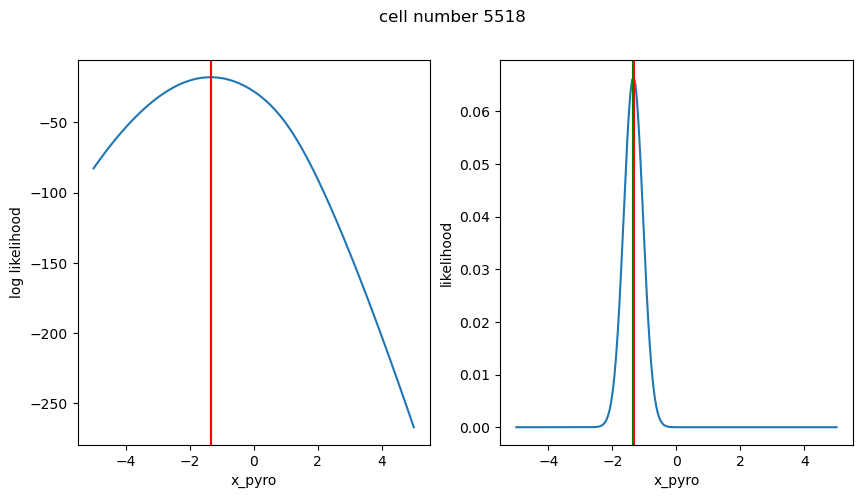

In [52]:
ind = np.random.randint(low=0, high=NC)

# ind=x_pyro.argmax()
ll_cx_0 = ll_cx[ind, :]
l_cx_0 = l_cx[ind, :]

plt.figure(figsize=(10, 5))
plt.suptitle("cell number {}".format(ind))

plt.subplot(121)
plt.plot(torch.linspace(-5, 5, NX).detach(), ll_cx_0.detach())
plt.axvline(l_x_means[ind], c="green")
plt.axvline(x_pyro[ind], c="red")
plt.ylabel("log likelihood")
plt.xlabel("x_pyro")

plt.subplot(122)
plt.plot(torch.linspace(-5, 5, NX).detach(), l_cx_0)
plt.axvline(x_pyro[ind], c="red")
plt.axvline(l_x_means[ind], c="green")
plt.ylabel("likelihood")
plt.xlabel("x_pyro")

print("pyro_mean ", x_pyro[ind], "my mean ", l_x_means[ind])
print(l_x_std[ind])

Text(0, 0.5, 'mean of distr')

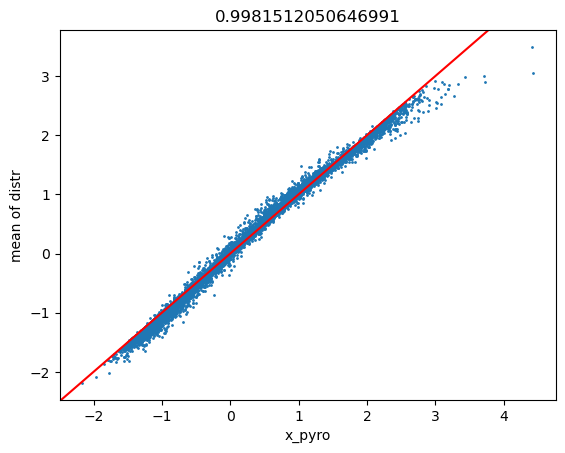

In [ ]:
plt.title(np.corrcoef(x_pyro, l_x_means)[0, 1])
plt.scatter(x_pyro, l_x_means, s=1)
plt.axline((0, 0), slope=1, c="red")
plt.xlabel("x_pyro")
plt.ylabel("mean of distr")

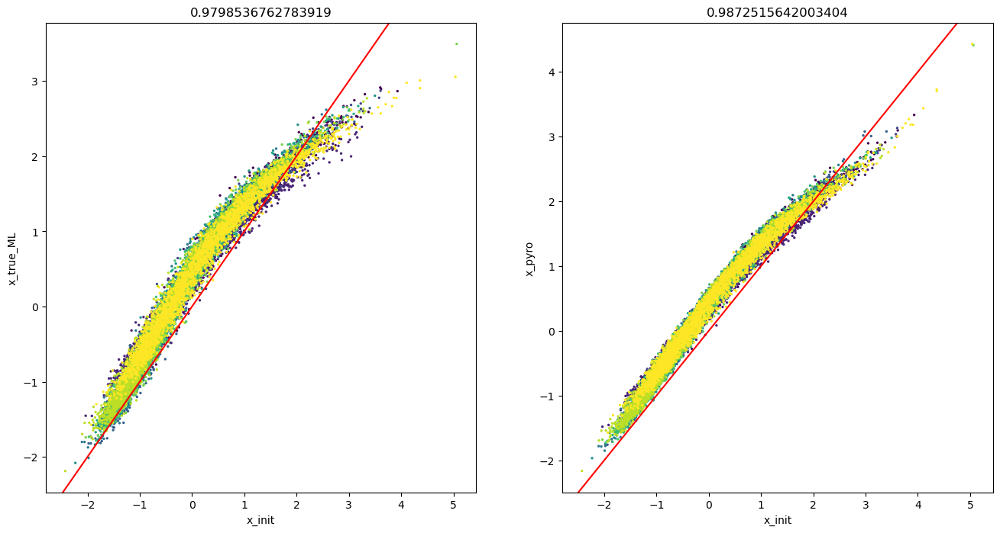

In [ ]:
plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.title(np.corrcoef(x_unif, l_x_means)[0, 1])
plt.scatter(x_unif, l_x_means, s=2, c=sample_id)
# plt.title('')
plt.xlabel("x_init")
plt.ylabel("x_true_ML")
plt.axline((0, 0), slope=1, c="red")

plt.subplot(122)
plt.title(np.corrcoef(x_unif, x_pyro)[0, 1])
plt.scatter(x_unif, x_pyro, s=2, c=sample_id)
# plt.title('')
plt.xlabel("x_init")
plt.ylabel("x_pyro")
plt.axline((0, 0), slope=1, c="red")

Text(0, 0.5, 'std of position of cell')

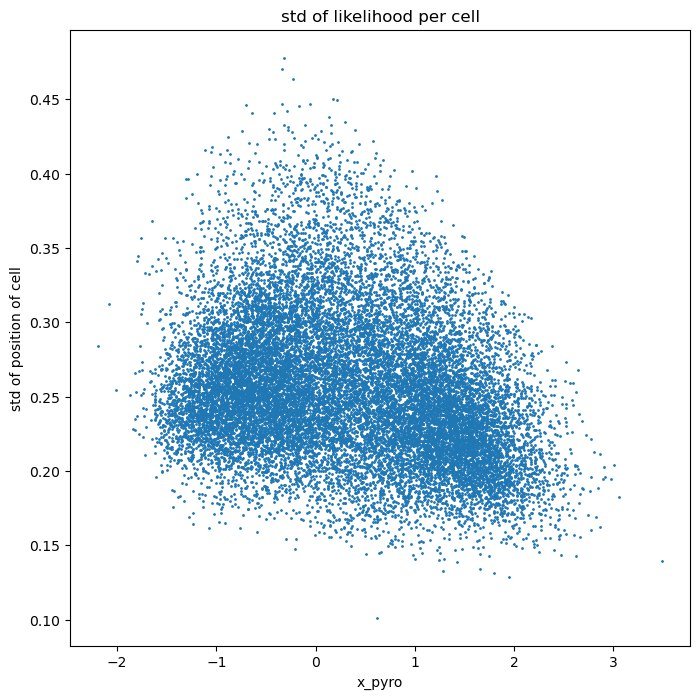

In [ ]:
# plt.title('std of likelihood per cell')
# plt.scatter(x_pyro, l_x_std, s=1)
# plt.xlabel('x_pyro')
# plt.ylabel('std of position of cell')
plt.figure(figsize=(8, 8))
plt.title("std of likelihood per cell")
plt.scatter(l_x_means, l_x_std, s=1)
plt.xlabel("x_pyro")
plt.ylabel("std of position of cell")

In [ ]:
x_new = l_x_means.clone()

# plots with the new x

In [ ]:
a0_pyro.shape

(11, 18)

In [ ]:
def f_norm(x):
    y = x[:, None] * a1_pyro[None, :]
    y += np.matmul(DM[:, :].detach().numpy(), a0_pyro[:, :])
    return np.exp(y)


def f_norm_cont(x, gene_idx, sample_idx):
    y = x[:, None] * a1_pyro[None, gene_idx]
    y += a0_pyro[sample_idx, gene_idx]
    return np.exp(y)


# f_norm_cont(xx, gene_index(data_pyro, "Cyp2e1"), 0)

In [ ]:
def gene_index(data, gene):
    return np.where(gene == data.var.index)[0][0]


y_mean = f_norm(x_pyro)

# y_mean_new = f_norm(xx)

print(x_pyro)
x_biggest = x_pyro.argsort()[-5:]
mask_b = np.ones(NC)
mask_b[x_biggest] = 0
mask_b = np.array(mask_b, dtype=bool)

xx = np.linspace(x_pyro[mask_b].min(), x_pyro[mask_b].max(), 2000)

[-1.08377035 -2.45984916 -0.50329939 ... -0.90811556 -0.39823421
 -1.13085461]


In [ ]:
np.unique(sample_id)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


array(['scRNA_Seq_Tomaz_211129-01-F-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_211129-02-M-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_211129-03-F-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_211215-05-M-ZT10-H-lib_M-129S',
       'scRNA_Seq_Tomaz_220530-01-M-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220530-02-F-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220531-01-M-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220531-02-F-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220531-03-M-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220601-02-F-ZT22-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220614-01-M-ZT10-H-lib_1-129S',
       'scRNA_Seq_Tomaz_220614-02-F-ZT10-H-lib_1-129S'], dtype=object)

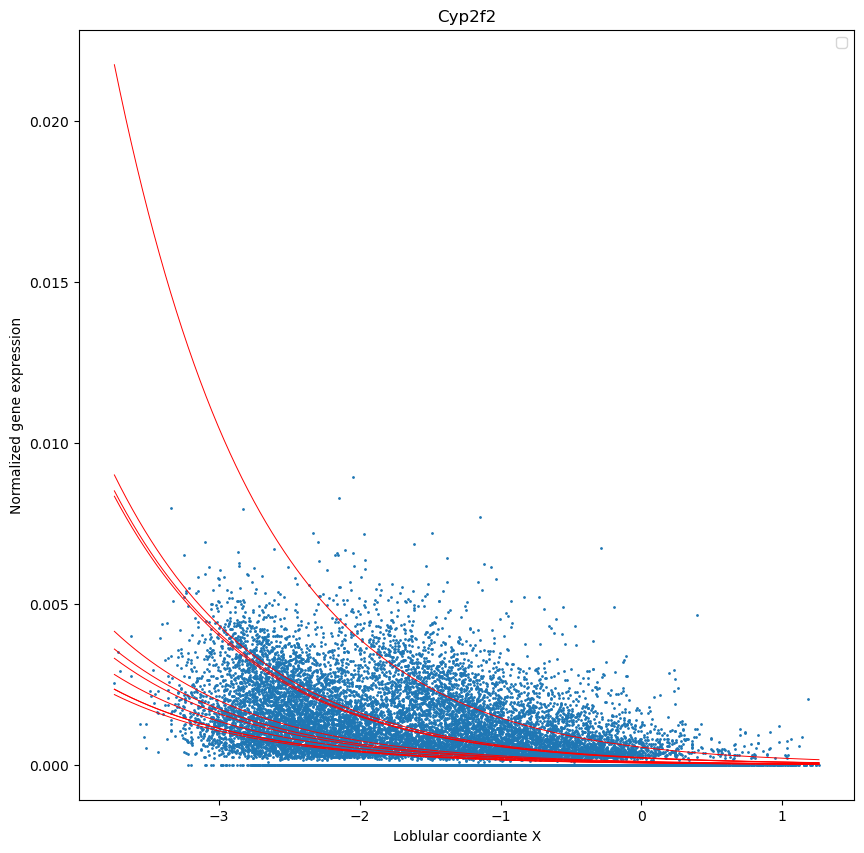

In [ ]:
gene = "Cyp2f2"

# plt.scatter(x_pyro[mask_b], data_pyro[mask_b, gene].layers["f_cg"], s=1)
# plt.plot(
#     xx,
#     f_norm_cont(xx, gene_index(data_pyro, gene), 0),
#     color="red",
# )
# plt.xlabel("Pyro latent var X")
# plt.show()


# same plot but i want to cycle over samples and plot the f_norm_cont
plt.figure(figsize=(10, 10))
plt.scatter(x_pyro[mask_b], data_pyro[mask_b, gene].layers["f_cg"], s=1)
for s, i in enumerate(np.unique(sample_id)):
    plt.plot(
        xx,
        f_norm_cont(xx, gene_index(data_pyro, gene), i),
        color="red",
        # thin line
        linewidth=0.7,
        # label=s,
    )
plt.title(gene)
plt.xlabel("Loblular coordiante X")
plt.ylabel("Normalized gene expression")
plt.legend()

sample_list

### genes

In [ ]:
portal = [
    "Pigr",
    "Plxna2",
    "B4galt5",
    "Pck1",
    "Etnppl",
    "Slc25a51",
    "Arhgap24",
    "Hsd17b13",
    "Sds",
    "Retsat",
    "Uroc1",
    "Apoc2",
    "Cyp2a4",
    "Cyp2f2",
    "Hpx",
    "Fgfr2",
    "Slc7a2",
    "Apoa4",
    "Ftcd",
    "Hal",
    "Gls2",
    "Serpina1d",
    "Aspg",
    "Gcnt2",
    "Sfxn1",
    "C9",
    "Gldc",
]
central = [
    "Aox1",
    "Cyp27a1",
    "Glul",
    "Esrrg",
    "Fam107b",
    "Cyp7b1",
    "Cyp7a1",
    "Pon1",
    "Slco1b2",
    "Cyp2a5",
    "Oat",
    "Cyp2e1",
    "Tenm3",
    "Msmo1",
    "Cyp1a2",
    "Aqp9",
    "Sult3a1",
    "Slc16a10",
    "Tafa2",
    "Igfbp1",
    "Aldh3a2",
    "Rnf43",
    "Ahr",
    "Slc25a21",
    "Rdh11",
    "Acot3",
    "Lect2",
    "Ube2e2",
    "Erc2",
    "Rnase4",
    "Ang",
    "Ang4",
    "Gulo",
    "Cyp2d9",
    "Csad",
    "Slc22a1",
    "Rmdn2",
    "Ablim3",
    "Aldh1a1",
    "Cyp2c38",
    "Cyp2c69",
    "Cyp2c37",
    "Cyp2c54",
    "Cyp2c50",
    "Slk",
    "Cyp3a41b",
    "Cyp3a41a",
    "Cyp3a44",
    "Sult3a2",
]

In [ ]:
interesting_genes = [
    "Glul",
    "Cyp2e1",
    "Cyp2f2",
    "Oat",
    "Hsd17b13",
    "Sds",
    "Slk",
    "Apoa4",
    "Gulo",
    "Pck1",
    "Hpx",
]

In [ ]:
for gene in genes:
    if gene in interesting_genes:
        # plt.figure(figsize=(10,10))
        # plt.title(gene)
        # plt.scatter(x_pyro[:], data_pyro[:,gene].layers['f_cg'] ,s=1)
        # plt.scatter(x_pyro[:], y_mean[:, gene_index(data_pyro,gene)] ,color='red' , s=0.3)
        # plt.xlabel("Pyro latent var X")

        plt.figure(figsize=(9, 7))
        plt.title(gene)
        plt.scatter(x_pyro[mask_b], data_pyro[mask_b, gene].layers["f_cg"], s=1)
        plt.scatter(
            x_pyro[mask_b],
            y_mean[mask_b, gene_index(data_pyro, gene)],
            color="red",
            s=0.3,
        )
        plt.xlabel("Pyro latent var X")
        plt.show()

        # plt.subplot(122)
        # plt.scatter(l_x_means[:], data_pyro[:,gene].layers['f_cg'] ,s=1)
        # plt.scatter(l_x_means[:], y_mean_new[:, gene_index(data_pyro,gene)] ,color='red' , s=0.3)
        # plt.xlabel("Pyro latent var X")

KeyboardInterrupt: 

In [ ]:
xs = []
# central2=['Glul', 'Slc1a2']
for s in np.unique(sample_id):
    # print(s)
    idx = sample_id == s
    central_score = data[idx, central].layers["f_cg"].sum(1)
    x = x_new[idx]
    rc = central_score.argsort().argsort() / idx.sum()
    offset = x[np.logical_and(rc > 0.9, rc < 0.99)].median()
    col = np.logical_and(rc > 0.9, rc < 0.99)
    xs.append(offset)
    plt.scatter(1 - rc, x - offset, s=1, alpha=0.5)
    plt.xlabel("1- ranking of central score")
    plt.ylabel("x - offset")
    plt.xscale("log")
plt.show()
xs

for s in np.unique(sample_id):
    idx = sample_id == s
    portal_score = data[idx, portal].layers["f_cg"].sum(1)
    x = x_new[idx]
    rp = portal_score.argsort().argsort() / idx.sum()
    # offset=x[np.logical_and(r>0.9, r<0.99)].median()
    # xs.append(offset)
    plt.scatter(rp, x - xs[s], s=1, alpha=0.5)
    plt.xscale("log")
    plt.xlabel("ranking of portal score")
    plt.ylabel("x - offset")

NameError: name 'x_new' is not defined

In [ ]:
# plt.figure(figsize=(10,5))
# x_shifted=np.zeros(NC)
# for s in np.unique(sample_id):
#     x=x_new[sample_id==s]
#     x=x-xs[s]+2
#     x_shifted[sample_id==s]=x
#     plt.hist(x, bins=100, alpha=0.5, label=s)
#     plt.xlim((-5,5))
#     plt.xlabel('x_pyro')
#     plt.title(' '.join(sample_annot[s,3:]))
#     plt.show()
# plt.legend()

# analyszing correlations

In [ ]:
log_UMI

tensor([7.8785, 8.2454, 7.0570,  ..., 8.0291, 7.2605, 7.9349],
       dtype=torch.float64)

In [ ]:
mean_normalized = tt(x_pyro)[:, None] * tt(a1_pyro)[None, :] + np.matmul(DM, a0_pyro)
mean_normalized = torch.exp(mean_normalized)

In [ ]:
y = tt(x_pyro)[:, None] * tt(a1_pyro)[None, :] + log_UMI[:, None]
y += np.matmul(DM, a0_pyro)
lmbda = torch.exp(y)
r = 1 / disp
p = disp * lmbda / (disp * lmbda + 1)
like_pyro = torch.distributions.NegativeBinomial(
    total_count=r, probs=p, validate_args=None
)

In [ ]:
lmbda

tensor([[ 0.4653, 10.3922,  0.5862,  ...,  0.3661,  0.9698,  0.4494],
        [ 0.2858,  3.7880,  0.3434,  ...,  1.1678,  3.7171,  2.5179],
        [ 0.2934,  8.1664,  0.3771,  ...,  0.1152,  0.2824,  0.1115],
        ...,
        [ 0.4758, 12.2938,  0.8664,  ...,  0.9362,  0.9999,  0.6201],
        [ 0.3028,  9.4915,  0.5611,  ...,  0.3236,  0.3228,  0.1739],
        [ 0.3771,  8.9542,  0.6814,  ...,  0.9687,  1.0659,  0.7029]],
       dtype=torch.float64)

In [ ]:
data_m = like_pyro.sample()

In [ ]:
data_pyro[:, :].layers["f_cg"]

ArrayView([[0.        , 0.0030303 , 0.        , ..., 0.        ,
            0.        , 0.00037879],
           [0.00026247, 0.00026247, 0.        , ..., 0.        ,
            0.00026247, 0.00026247],
           [0.00086133, 0.00947459, 0.00086133, ..., 0.        ,
            0.        , 0.00086133],
           ...,
           [0.        , 0.00488759, 0.00032584, ..., 0.00065168,
            0.        , 0.        ],
           [0.        , 0.00843289, 0.        , ..., 0.        ,
            0.00070274, 0.        ],
           [0.00035804, 0.00358038, 0.        , ..., 0.00107411,
            0.00035804, 0.        ]], dtype=float32)

In [ ]:
matrix_model = np.corrcoef(mean_normalized.detach().numpy().squeeze().T)
matrix_data = np.corrcoef(data_pyro[:, :].layers["f_cg"].T)

np.fill_diagonal(matrix_model, 0)
np.fill_diagonal(matrix_data, 0)

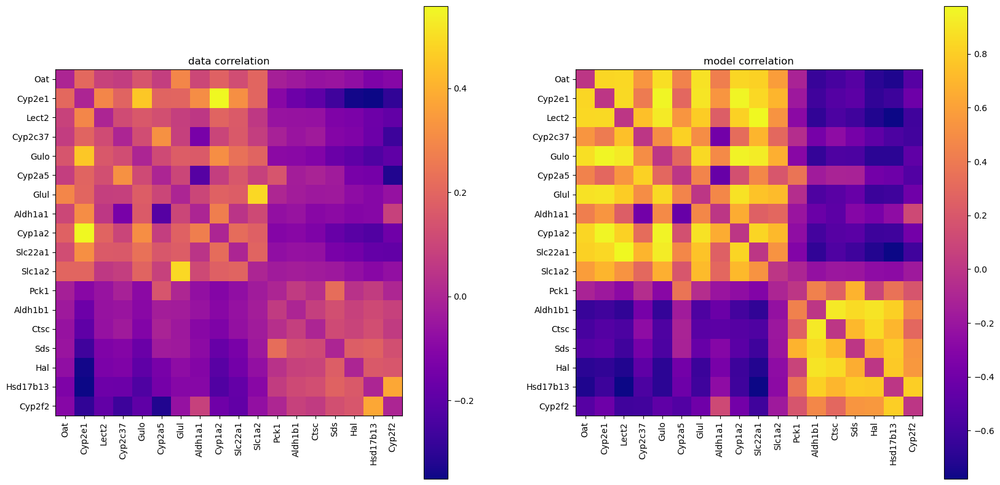

In [ ]:
# now do a side by side plot, with the plot above and teh corr of the real data
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.imshow(matrix_data, cmap="plasma")
plt.colorbar()
plt.title("data correlation")
# put genes names on the axis
plt.xticks(np.arange(0, len(genes)), genes, rotation=90)
plt.yticks(np.arange(0, len(genes)), genes)

plt.subplot(122)
plt.imshow(matrix_model, cmap="plasma")
plt.colorbar()
plt.title("model correlation")
# put genes names on the axis
plt.xticks(np.arange(0, len(genes)), genes, rotation=90)
plt.yticks(np.arange(0, len(genes)), genes)
plt.show()

there is correlation! even more than in the dataset!

In [ ]:
data_mm = like_pyro.sample(torch.Size([1000]))

In [ ]:
genes[8]

'Cyp1a2'

In [ ]:
# cehcking that theres no correlaation in these two columns
check = data_mm[:, [1, 8], [1, 8]]
# correlation between two columns
np.corrcoef(check[:, 0], check[:, 1])

array([[ 1.        , -0.06860722],
       [-0.06860722,  1.        ]])

# analizing residuals

In [ ]:
def like_matrix(x, a0, a1, disp, log_UMI, DM, DATA):
    """
    just a function to compute the likelihood of either the real data
    or the simulated data created chosing particular latent parameters
    """
    y = x[:, None] * a1[None, :] + log_UMI[:, None]
    y += np.matmul(DM, a0)
    lmbda = torch.exp(y)
    r = 1 / disp
    p = disp * lmbda / (disp * lmbda + 1)
    like_pyro = torch.distributions.NegativeBinomial(
        total_count=r, probs=p, validate_args=None
    )
    ll_cg = like_pyro.log_prob(DATA).detach()

    return ll_cg


likeM = like_matrix(tt(x_pyro), tt(a0_pyro), tt(a1_pyro), 0.1414, log_UMI, DM, DATA)

In [ ]:
likeM.shape
like_g = likeM.sum(axis=0)
like_c = likeM.sum(axis=1)

from now on we can go crazy with plots

Text(0, 0.5, 'sum of likelihood per cell')

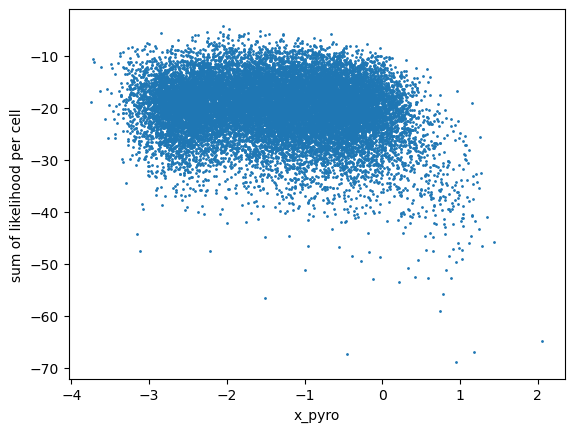

In [ ]:
plt.scatter(x_pyro, like_c, s=1)
plt.xlabel("x_pyro")
plt.ylabel("sum of likelihood per cell")

In [ ]:
mean_normalized.shape

torch.Size([20080, 18])

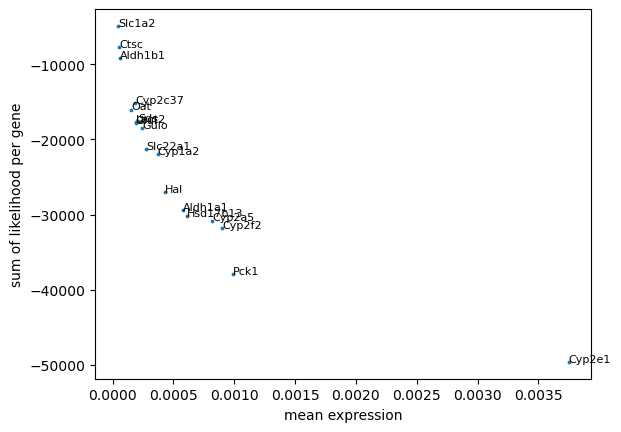

In [ ]:
# plot mean expression in normnalized data vs likelihood_g, and  annotate with gene names
plt.scatter(data_pyro[:, :].layers["f_cg"].mean(axis=0), like_g, s=3)
plt.xlabel("mean expression")
plt.ylabel("sum of likelihood per gene")
for i, txt in enumerate(genes):
    plt.annotate(
        txt, (data_pyro[:, :].layers["f_cg"].mean(axis=0)[i], like_g[i]), fontsize=8
    )

In [ ]:
# print gene name next to the likelihood summed over cells
for i, txt in enumerate(genes):
    print(txt, likeM[:, i].sum())

NameError: name 'likeM' is not defined

# tSNE

In [ ]:
tsne = data.obsm["X_tsne"]
tsne.shape
sample_id

array([ 0,  0,  0, ..., 10, 10, 10])

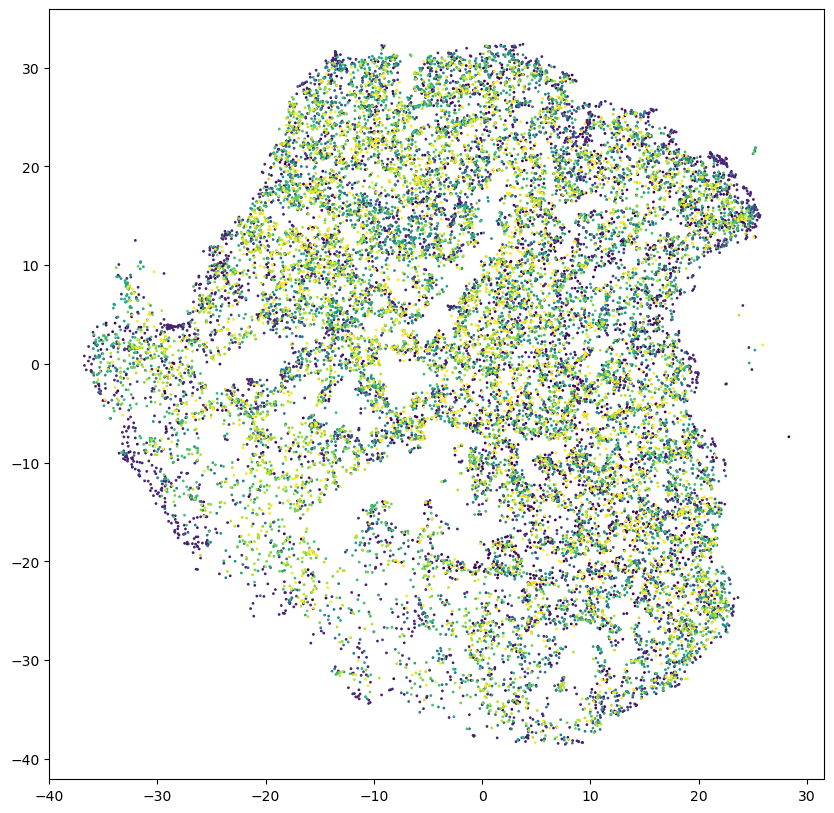

In [ ]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne[:, 0], tsne[:, 1], s=1, c=sample_id)

## binned plots

In [ ]:
# nc_bin=int(np.floor(x_pyro.shape[0]/12))
# layer_c=np.zeros(NC)

# #here i need to use argsort to order the positions
# x_sorted_mask=x_pyro.argsort()
# for i in range(12):
#     if i==11:
#         layer_c[x_sorted_mask[(i)*nc_bin :             ]]=i
#     else:
#         layer_c[x_sorted_mask[(i)*nc_bin:(i+1)*nc_bin-1]]=i

# layer_c

In [ ]:
def bin_vec(v):
    v = v.flatten()
    nc_bin = int(np.floor(v.shape[0] / 12))
    layer = np.zeros(v.shape[0])
    x_sorted_mask = v.argsort()
    for i in range(12):
        if i == 11:
            layer[x_sorted_mask[(i) * nc_bin :]] = i
        else:
            layer[x_sorted_mask[(i) * nc_bin : (i + 1) * nc_bin - 1]] = i
    return layer


# layer_c=bin_vec(x_pyro)
vv = bin_vec(data[:, "Glul"].layers["f_cg"])

In [ ]:
z = np.array(data[:, "Glul"].layers["f_cg"][:6]).flatten()
print(z)
z.argsort()

[0.00113636 0.         0.         0.         0.         0.        ]


array([1, 2, 3, 4, 5, 0])

In [ ]:
def avarage_by_bin(gene, layer_c):
    dd = data_pyro[:, gene].layers["f_cg"].flatten()
    means = np.zeros(12)
    stds = np.zeros(12)
    for i in range(12):
        means[i] = dd[layer_c == i].mean()
        stds[i] = dd[layer_c == i].std()
    return means, stds


# binning in this way I dont see that different samples have different a0. I need to order by expression
def avarage_bin_NC(dd, layer_c):
    dd = dd.flatten()
    means = np.zeros(NC)

    for i in range(12):
        means[layer_c == i] = dd[layer_c == i].mean()

    return means


# avarage_bin_NC(data[:,'Glul'].layers['f_cg'],layer_c).shape
# print(means[layer_c==i])

In [ ]:
# here I call the bin_vec function that creates a new binning from the input vector, this binning is used to take avrages
def avarage_bin_NC_2(dd):
    dd = dd.flatten()
    layer = bin_vec(dd)
    means = np.zeros(NC)

    for i in range(12):
        means[layer == i] = dd[layer == i].mean()

    return means


print(avarage_bin_NC_2(y_mean[:, gene_index(data_pyro, "Cyp2e1")]))
# print( avarage_bin_NC(y_mean[:, gene_index(data_pyro, 'Cyp2e1') ],layer_c) )

[0.00460383 0.00136386 0.00799048 ... 0.00460383 0.00598521 0.00279714]


In [ ]:
# avarage_bin_NC(data[:,'Glul'].layers['f_cg'], layer_c)

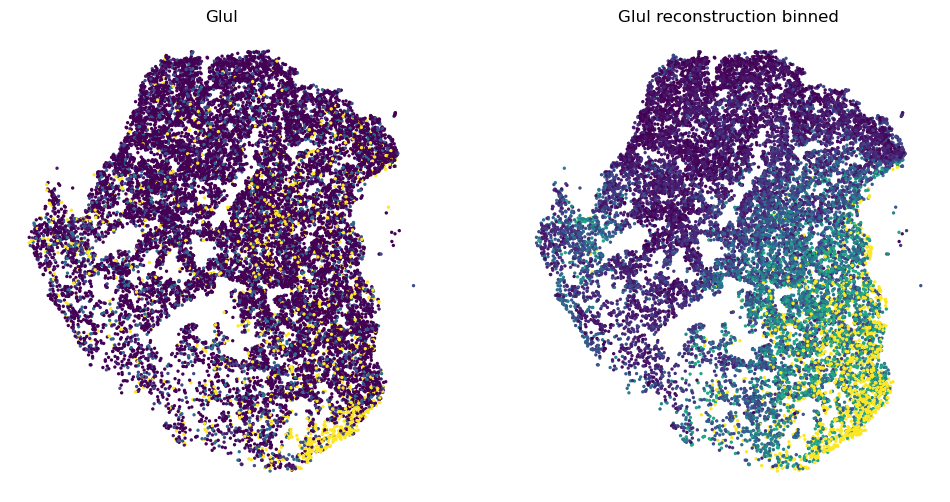

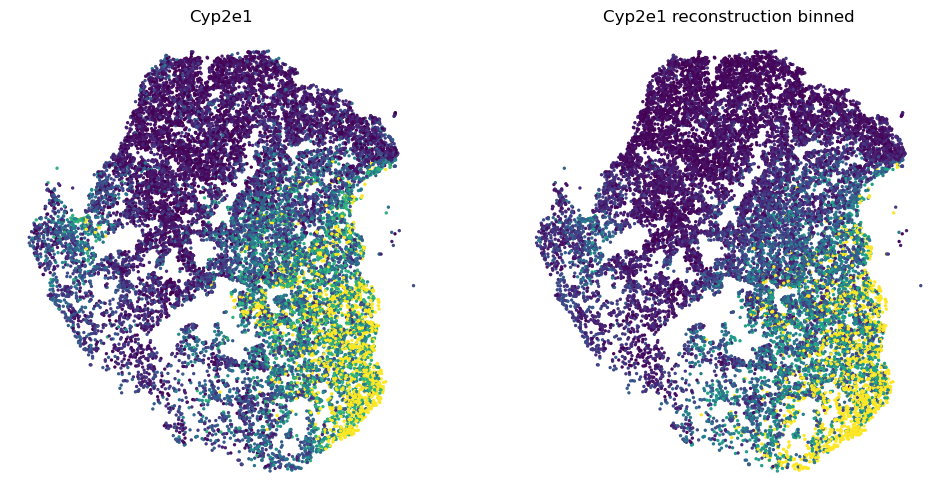

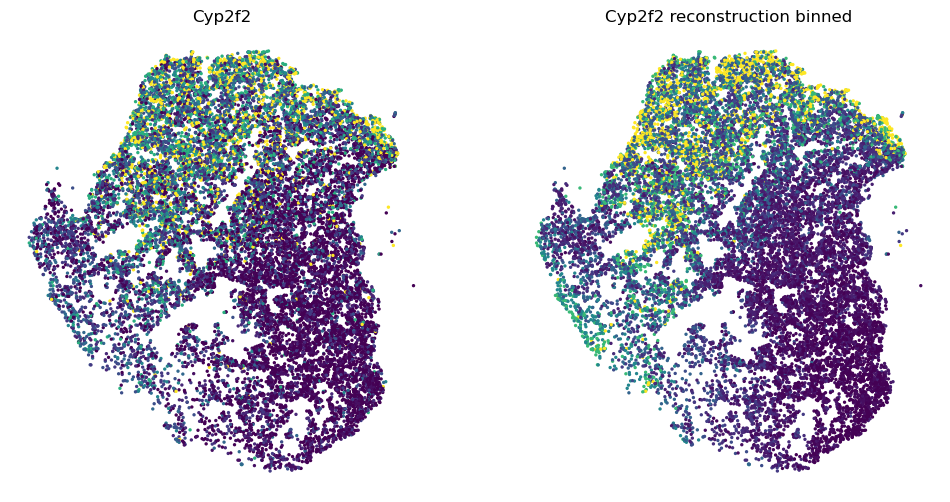

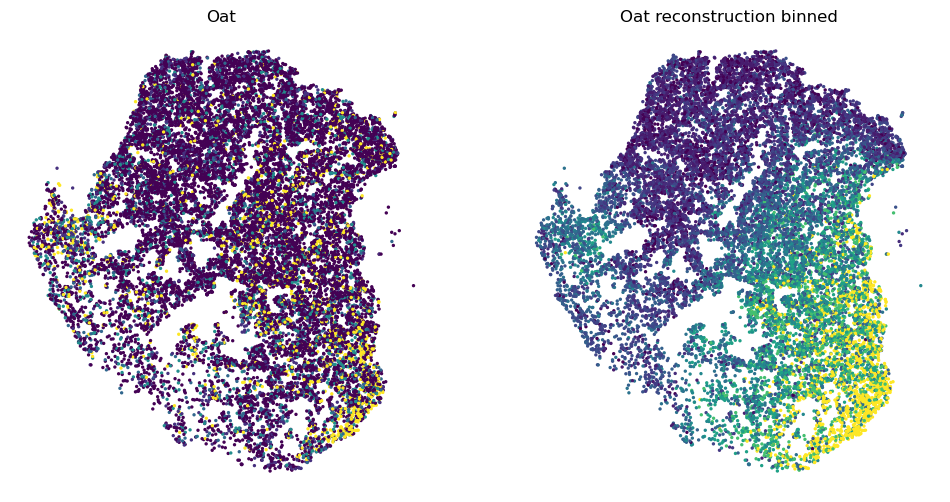

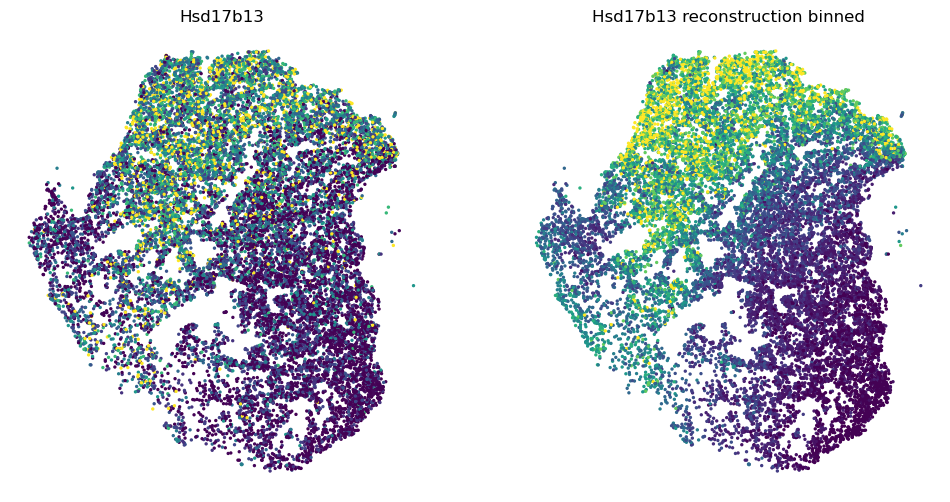

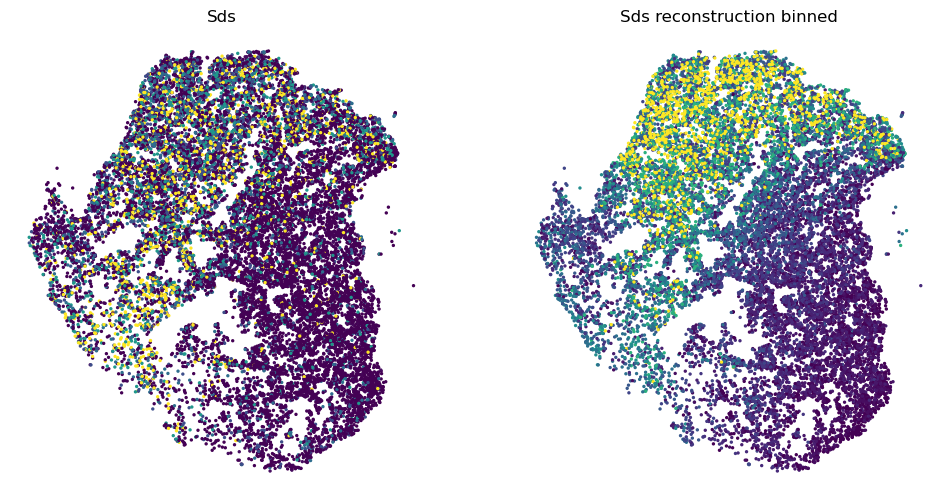

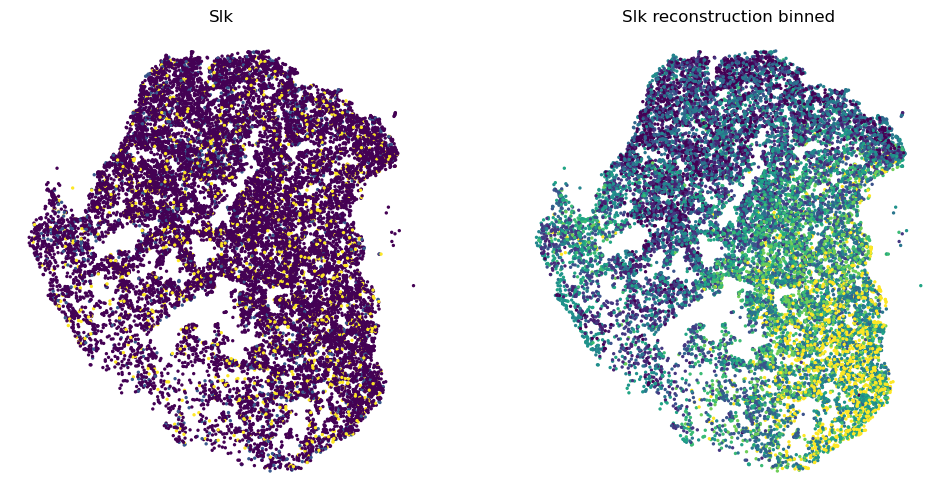

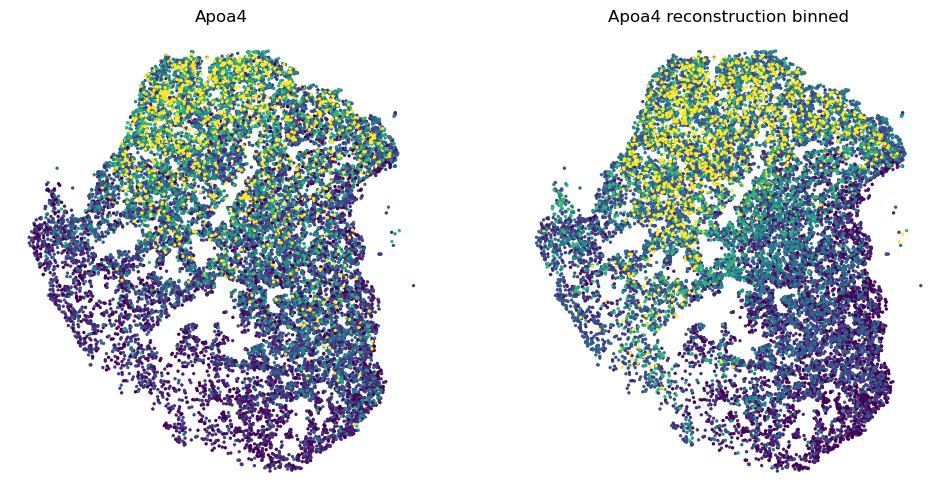

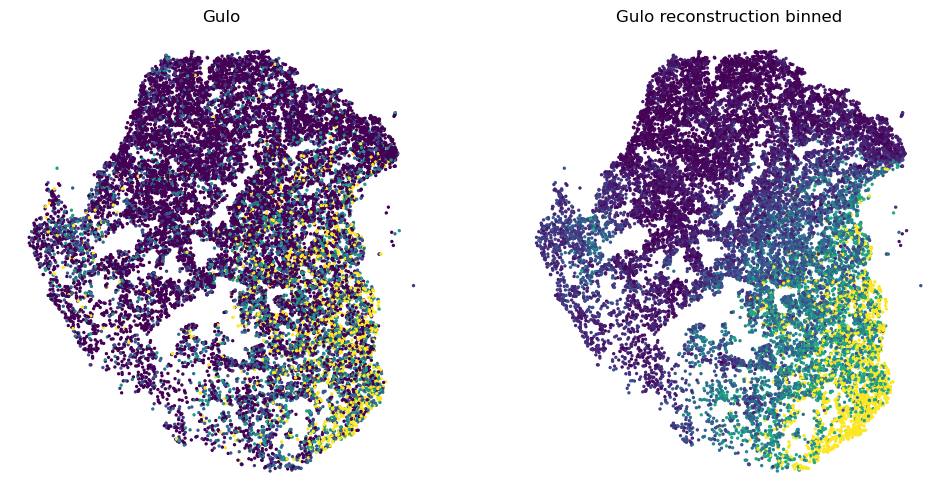

In [ ]:
for gene in [
    "Glul",
    "Cyp2e1",
    "Cyp2f2",
    "Oat",
    "Hsd17b13",
    "Sds",
    "Slk",
    "Apoa4",
    "Gulo",
]:
    plt.figure(figsize=(12, 6))
    # plt.suptitle('Comparison between data and reconstruction')

    plt.subplot(121)
    plt.title(gene)
    plt.scatter(
        tsne[:, 0],
        tsne[:, 1],
        s=2,
        c=avarage_bin_NC_2(data_pyro[:, gene].layers["f_cg"]),
    )
    plt.axis("off")

    plt.subplot(122)
    plt.title(gene + " reconstruction binned")
    plt.scatter(
        tsne[:, 0],
        tsne[:, 1],
        s=2,
        c=avarage_bin_NC_2(y_mean[:, gene_index(data_pyro, gene)]),
    )
    plt.axis("off")

## non binned tsne plots

(-40.008290071090315,
 31.602714537486868,
 -42.366025246166046,
 35.94060618107598)

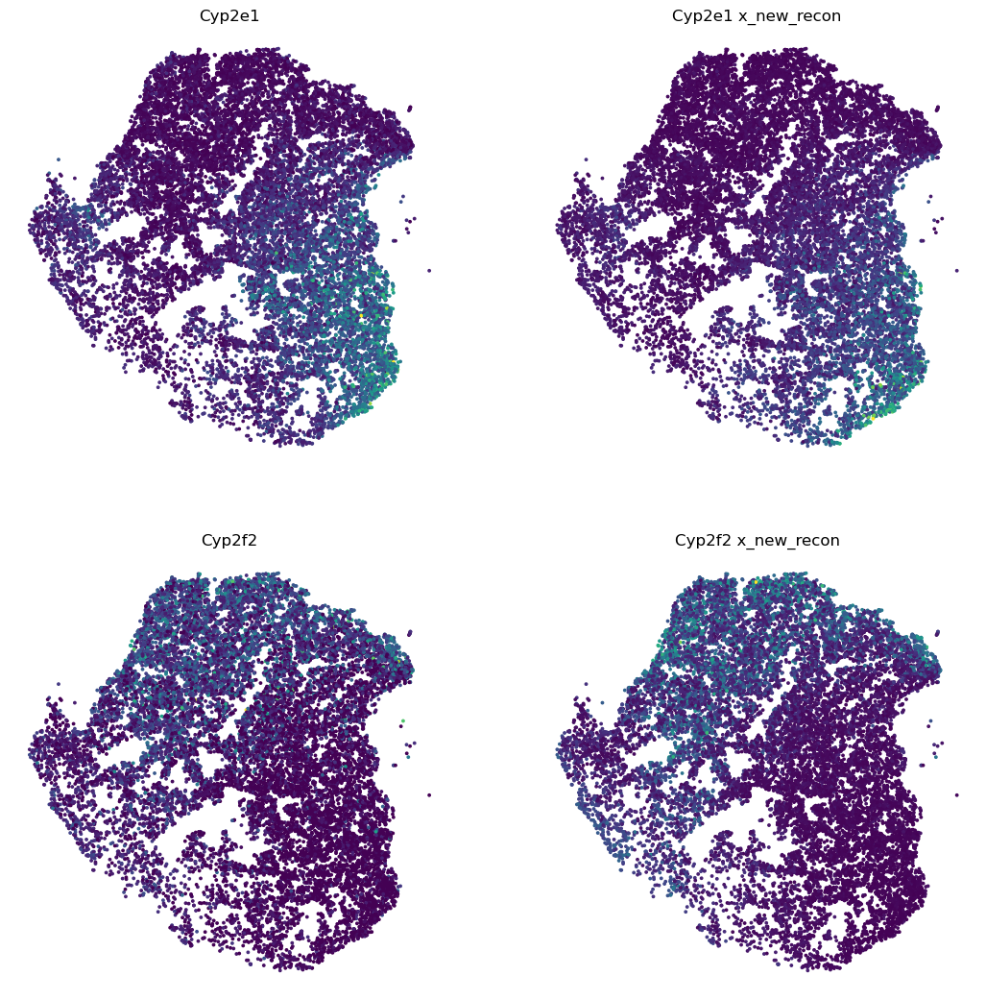

In [ ]:
gene = "Cyp2e1"
plt.figure(figsize=(13, 13))
# plt.suptitle('Comparison between data and reconstruction')

plt.subplot(221)
plt.title("Cyp2e1")
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=data[:, "Cyp2e1"].layers["f_cg"])
plt.axis("off")

plt.subplot(222)
plt.title(gene + " x_new_recon")
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=y_mean_new[:, gene_index(data_pyro, gene)])
plt.axis("off")

gene = "Cyp2f2"
plt.subplot(223)
plt.title(gene)
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=data[:, gene].layers["f_cg"])
plt.axis("off")

plt.subplot(224)
plt.title(gene + " x_new_recon")
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=y_mean_new[:, gene_index(data_pyro, gene)])
plt.axis("off")

(-40.008290071090315,
 31.602714537486868,
 -42.366025246166046,
 35.94060618107598)

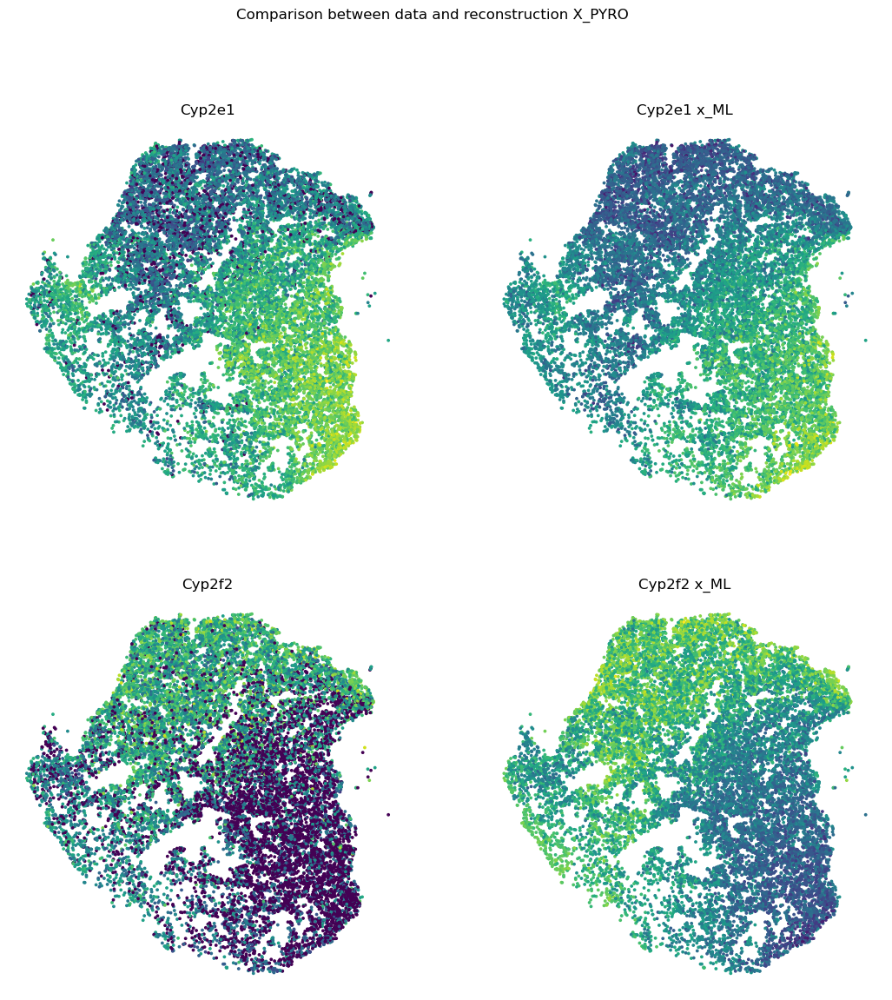

In [ ]:
OFFSET = 0.0001
gene = "Cyp2e1"
plt.figure(figsize=(13, 13))
plt.suptitle("Comparison between data and reconstruction X_PYRO")

plt.subplot(221)
plt.title("Cyp2e1")
plt.scatter(
    tsne[:, 0], tsne[:, 1], s=3, c=data[:, gene].layers["f_cg"] + OFFSET, norm="log"
)
plt.axis("off")

plt.subplot(222)
plt.title(gene + " x_ML")
plt.scatter(
    tsne[:, 0],
    tsne[:, 1],
    s=3,
    c=y_mean_new[:, gene_index(data_pyro, gene)],
    norm="log",
)
plt.axis("off")

gene = "Cyp2f2"

plt.subplot(223)
plt.title(gene)
plt.scatter(
    tsne[:, 0], tsne[:, 1], s=3, c=data[:, gene].layers["f_cg"] + OFFSET, norm="log"
)
plt.axis("off")

plt.subplot(224)
plt.title(gene + " x_ML")
plt.scatter(
    tsne[:, 0],
    tsne[:, 1],
    s=3,
    c=y_mean_new[:, gene_index(data_pyro, gene)],
    norm="log",
)
plt.axis("off")

(-40.008290071090315,
 31.602714537486868,
 -42.366025246166046,
 35.94060618107598)

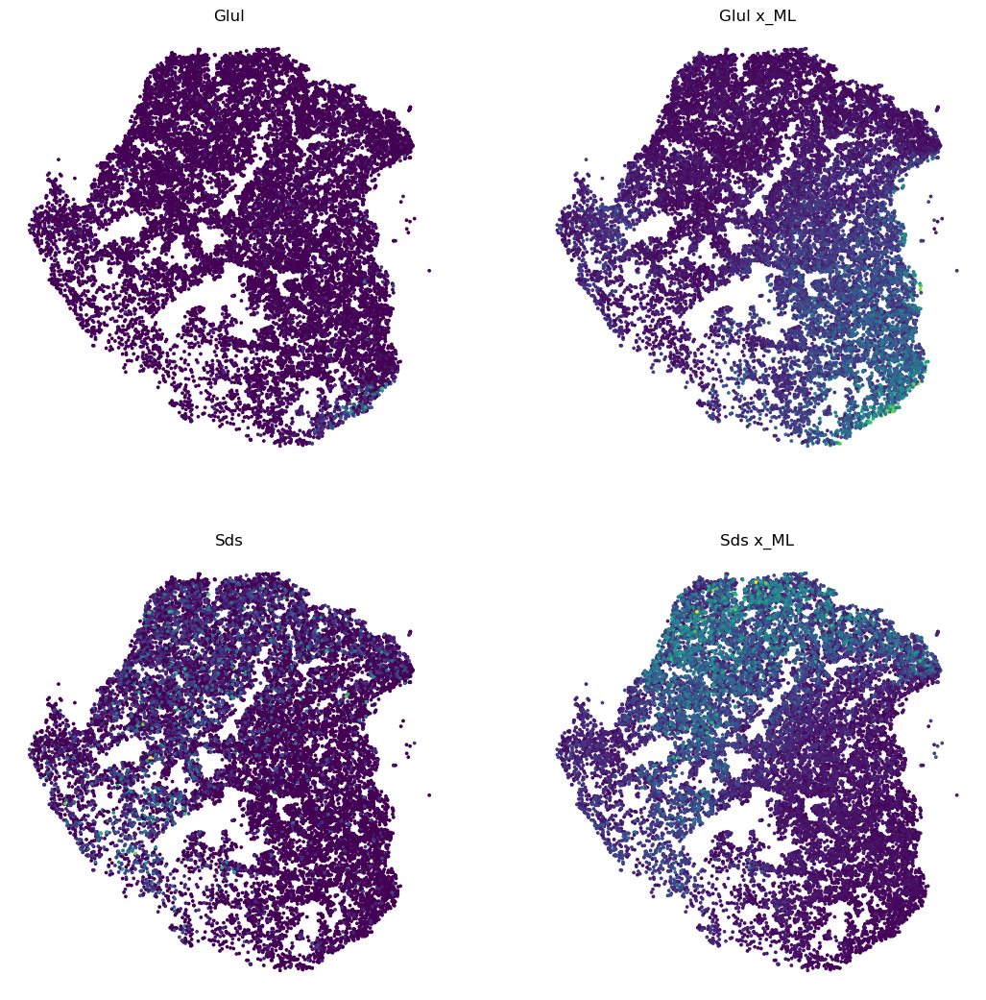

In [ ]:
OFFSET = 0.000001
gene = "Glul"
plt.figure(figsize=(13, 13))
# plt.suptitle('Comparison between data and reconstruction X_PYRO')

plt.subplot(221)
plt.title(gene)
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=data[:, gene].layers["f_cg"])
plt.axis("off")

plt.subplot(222)
plt.title(gene + " x_ML")
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=y_mean_new[:, gene_index(data_pyro, gene)])
plt.axis("off")

gene = "Sds"
plt.subplot(223)
plt.title(gene)
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=data[:, gene].layers["f_cg"])
plt.axis("off")

plt.subplot(224)
plt.title(gene + " x_ML")
plt.scatter(tsne[:, 0], tsne[:, 1], s=3, c=y_mean_new[:, gene_index(data_pyro, gene)])
plt.axis("off")

In [ ]:
z = torch.ones(5)
zz = 2 * z
z[2].detach()
z.grad